<a href="https://colab.research.google.com/github/kahram-y/first-repository/blob/master/DATAthon/smokerpred1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use("seaborn-v0_8")
sns.set(font_scale=1.1)

In [20]:
from google.colab import files
uploaded = files.upload()

In [21]:
train_full = pd.read_csv("/content/train.csv")
test_full = pd.read_csv("/content/test.csv")

# EDA

In [4]:
print("Train Shape:", train_full.shape)
print("Test Shape:", test_full.shape)

Train Shape: (159256, 24)
Test Shape: (106171, 23)


In [5]:
train_full.head(), test_full.head()

(   id  age  height(cm)  weight(kg)  waist(cm)  eyesight(left)  \
 0   0   55         165          60       81.0             0.5   
 1   1   70         165          65       89.0             0.6   
 2   2   20         170          75       81.0             0.4   
 3   3   35         180          95      105.0             1.5   
 4   4   30         165          60       80.5             1.5   
 
    eyesight(right)  hearing(left)  hearing(right)  systolic  ...  HDL  LDL  \
 0              0.6              1               1       135  ...   40   75   
 1              0.7              2               2       146  ...   57  126   
 2              0.5              1               1       118  ...   45   93   
 3              1.2              1               1       131  ...   38  102   
 4              1.0              1               1       121  ...   44   93   
 
    hemoglobin  Urine protein  serum creatinine  AST  ALT  Gtp  dental caries  \
 0        16.5              1               1

In [6]:
train_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159256 entries, 0 to 159255
Data columns (total 24 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   159256 non-null  int64  
 1   age                  159256 non-null  int64  
 2   height(cm)           159256 non-null  int64  
 3   weight(kg)           159256 non-null  int64  
 4   waist(cm)            159256 non-null  float64
 5   eyesight(left)       159256 non-null  float64
 6   eyesight(right)      159256 non-null  float64
 7   hearing(left)        159256 non-null  int64  
 8   hearing(right)       159256 non-null  int64  
 9   systolic             159256 non-null  int64  
 10  relaxation           159256 non-null  int64  
 11  fasting blood sugar  159256 non-null  int64  
 12  Cholesterol          159256 non-null  int64  
 13  triglyceride         159256 non-null  int64  
 14  HDL                  159256 non-null  int64  
 15  LDL              

In [7]:
# 통계 요약
train_full.describe().T.head()

,count,mean,std,min,25%,50%,75%,max
id,159256.0,79627.500000,45973.391572,0.0,39813.75,79627.5,119441.25,159255.0
age,159256.0,44.306626,11.842286,20.0,40.00,40.0,55.00,85.0
height(cm),159256.0,165.266929,8.818970,135.0,160.00,165.0,170.00,190.0
weight(kg),159256.0,67.143662,12.586198,30.0,60.00,65.0,75.00,130.0
waist(cm),159256.0,83.001990,8.957937,51.0,77.00,83.0,89.00,127.0


In [8]:
# 결측치 비율 확인
missing = train_full.isnull().mean().sort_values(ascending=False)
missing[missing > 0]   # 결측치가 있는 변수만 출력

,0


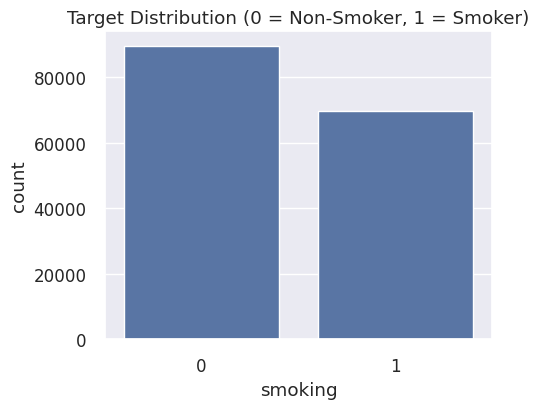

,proportion
smoking,
0,0.562635
1,0.437365


In [9]:
# Target 분포 확인
plt.figure(figsize=(5,4))
sns.countplot(data=train_full, x="smoking")
plt.title("Target Distribution (0 = Non-Smoker, 1 = Smoker)")
plt.show()

train_full["smoking"].value_counts(normalize=True)

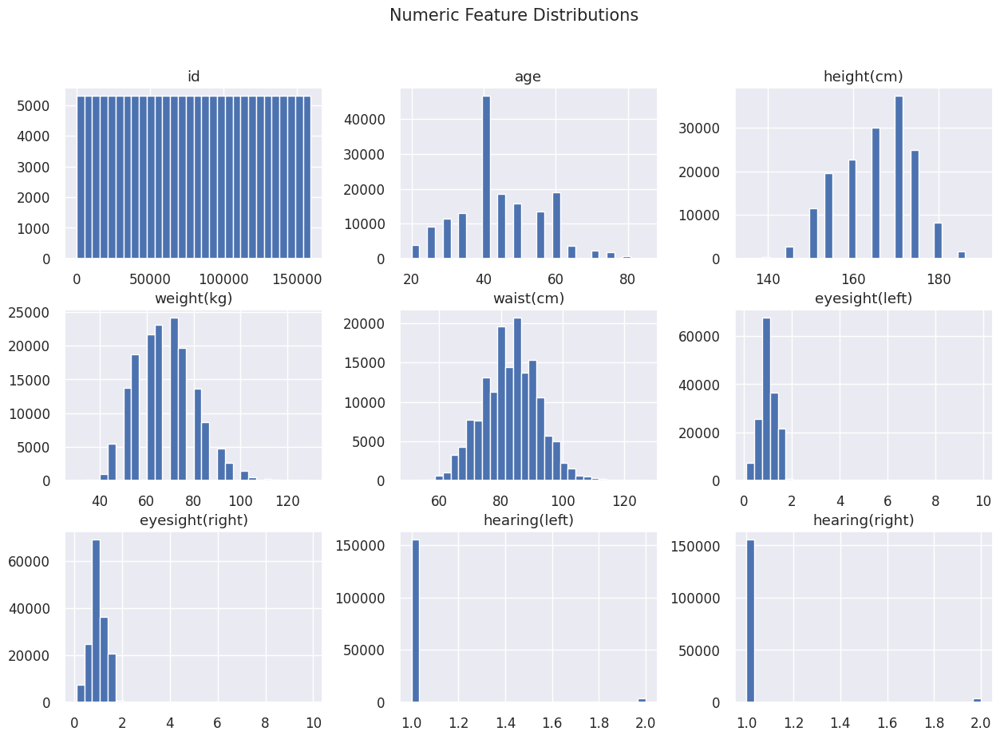

In [10]:
# 수치형 변수 리스트 추출
num_cols = train_full.select_dtypes(include=['int64','float64']).columns.tolist()
num_cols.remove("smoking")  # 타깃 제외

# 상위 9개만 샘플 시각화
sample_cols = num_cols[:9]

train_full[sample_cols].hist(figsize=(15,10), bins=30)
plt.suptitle("Numeric Feature Distributions", fontsize=15)
plt.show()

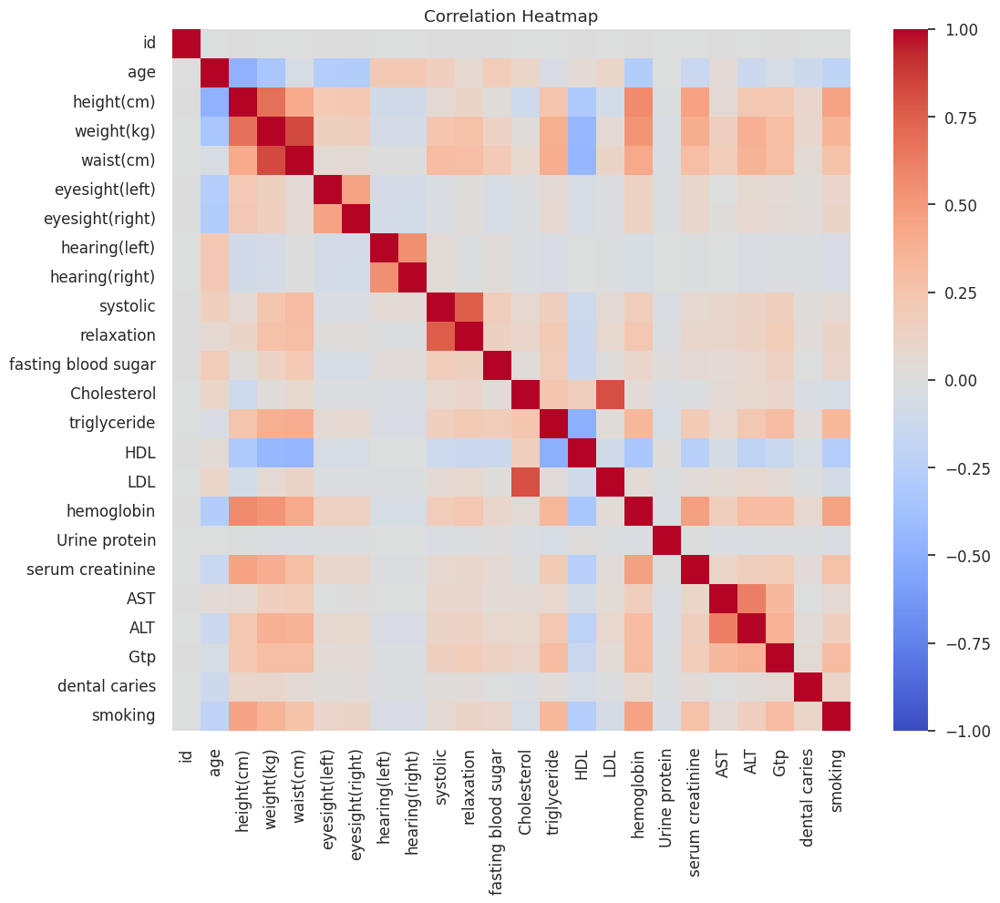

,smoking
smoking,1.000000
hemoglobin,0.450679
height(cm),0.447111
weight(kg),0.351748
triglyceride,0.331975
Gtp,0.305561
serum creatinine,0.272979
HDL,0.271186
waist(cm),0.262715
age,0.206033


In [11]:
# 상관관계 히트맵
plt.figure(figsize=(12,10))
corr = train_full[num_cols + ["smoking"]].corr()

sns.heatmap(corr, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Heatmap")
plt.show()

# 타깃과 상관 높은 상위 변수 TOP10
corr["smoking"].abs().sort_values(ascending=False).head(10)

# Variance Inflation Factor(VIF) 분석


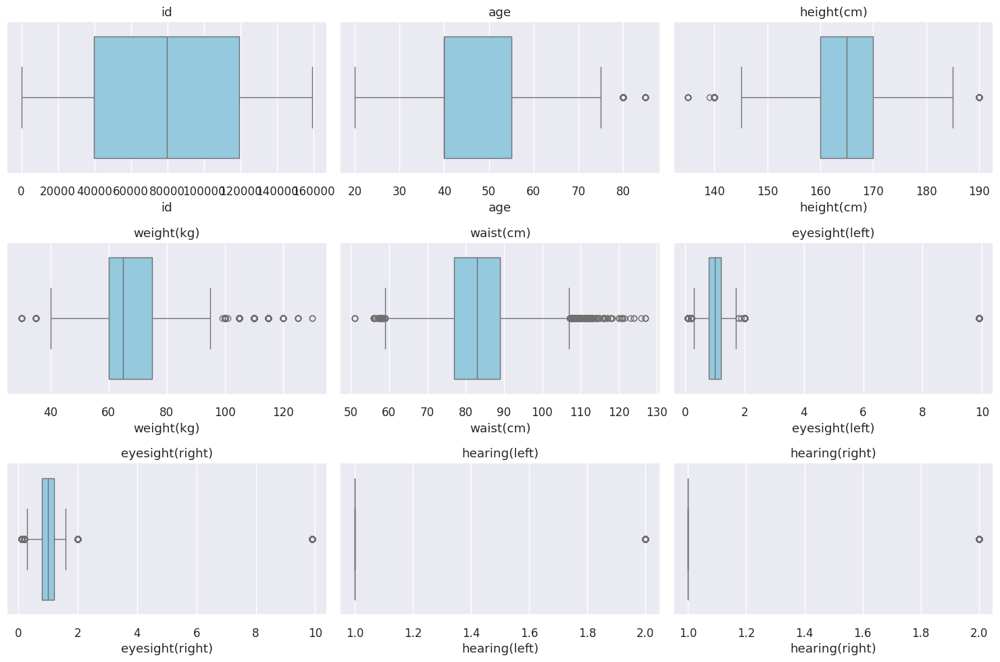

In [12]:
# 박스플롯으로 이상치 탐색
plt.figure(figsize=(15,10))
for i, col in enumerate(sample_cols, 1):
    plt.subplot(3,3,i)
    sns.boxplot(x=train_full[col], color="skyblue")
    plt.title(col)
plt.tight_layout()
plt.show()

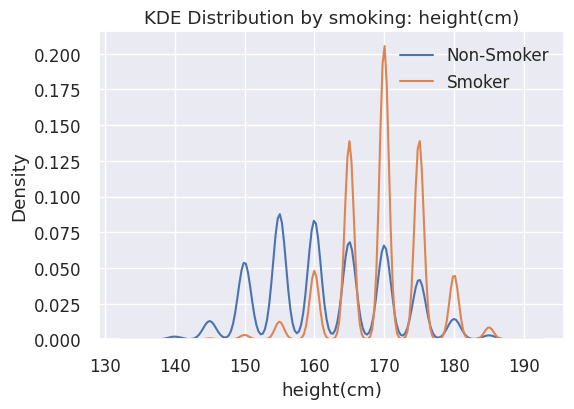

In [13]:
# 타깃 분류에 따라 분포가 다른지 비교
feature = sample_cols[2]  # 아무 변수 하나 선택 (예: 0-첫 번째 컬럼)

plt.figure(figsize=(6,4))
sns.kdeplot(train_full[train_full["smoking"]==0][feature], label="Non-Smoker")
sns.kdeplot(train_full[train_full["smoking"]==1][feature], label="Smoker")
plt.title(f"KDE Distribution by smoking: {feature}")
plt.legend()
plt.show()

# Feature Engineering

In [8]:
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

In [22]:
# 제거할 컬럼 정의 (Urine protein(요단백), dental caries(치아 우식) 두 변수 모두 심한 불균형 + 직접적 연관성이 낮아 노이즈 제거 효과 있음)
cols_to_drop = ["id", "Urine protein", "dental caries"]

# 타깃 분리
X = train_full.drop("smoking", axis=1)
y = train_full["smoking"]

# 제거 전 데이터셋
X_before = X.copy()

# 제거 후 데이터셋
X_after = X.drop(cols_to_drop, axis=1)

# 동일한 Train/Validation 분할
X_train_b, X_val_b, y_train_b, y_val_b = train_test_split(X_before, y, test_size=0.2, random_state=42, stratify=y)
X_train_a, X_val_a, y_train_a, y_val_a = train_test_split(X_after, y, test_size=0.2, random_state=42, stratify=y)

test  = test_full.drop(cols_to_drop, axis=1)

In [23]:
# 이상치 처리 (이상치 처리에 강건한 RobustScaler 또는 Winsorization(상위/하위 1~2% 컷))

# 수치형 컬럼만 선택
num_cols = X_after.select_dtypes(include=['int64', 'float64']).columns.tolist()

# -----------------------------------------
# 1) IQR Winsorization 파이프라인
# -----------------------------------------

# IQR 기반 Winsorization 함수
def remove_outliers_iqr(df, cols):
    df = df.copy()
    for c in cols:
        Q1 = df[c].quantile(0.25)
        Q3 = df[c].quantile(0.75)
        IQR = Q3 - Q1
        low = Q1 - 1.5 * IQR
        high = Q3 + 1.5 * IQR
        df[c] = df[c].clip(lower=low, upper=high)
    return df

# 이상치 처리
X_iqr = remove_outliers_iqr(X_after, num_cols)

# Train/Valid Split
X_train_iqr, X_valid_iqr, y_train_iqr, y_valid_iqr = train_test_split(
    X_iqr, y, test_size=0.2, random_state=42
)



# -----------------------------------------
# 2) RobustScaler 파이프라인 (이상치 처리에 강건. Logistic Regression / SVM / XGBoost 같은 모델에서 효과가 더 좋음. 단, Tree 모델에는 필요 없음.)
# -----------------------------------------

# RobustScaler 적용
rs = RobustScaler()
X_robust_scaled = pd.DataFrame(rs.fit_transform(X_after[num_cols]), columns=num_cols)
test_scaled = rs.transform(test)    # test에도 동일 적용

# Train/Valid Split
X_train_rb, X_valid_rb, y_train_rb, y_valid_rb = train_test_split(
    X_robust_scaled, y, test_size=0.2, random_state=42
)



In [24]:
# Feature 생성 (비율 변수 / 차이 변수 / 조합 변수 등)

# 1) HRV(심박수 변동성) Proxy 생성  : RMSSD 비슷한 변동성
# 2) 분산, 범위, 로그 변환
# 3) Interaction(교차항) 자동 생성

def feature_engineering(df):
    df = df.copy()
    cols = df.select_dtypes(include=['int64', 'float64']).columns

    # 1) HRV Proxy
    for c in cols:
        df[f"{c}_sq"] = df[c] ** 2
        df[f"{c}_abs"] = df[c].abs()

    # 2) 범위/분산 특징
    df["var_all"] = df[cols].var(axis=1)
    df["range_all"] = df[cols].max(axis=1) - df[cols].min(axis=1)
    # 로그 변환 (양수만)
    for c in cols:
        if (df[c] > 0).sum() > 0:
            df[f"{c}_log"] = np.log1p(df[c].clip(lower=0))

    # 3) 상호작용 (상위 5개 변수만 예시)
    top5 = cols[:5]
    for i in range(len(top5)):
        for j in range(i+1, len(top5)):
            df[f"inter_{top5[i]}_{top5[j]}"] = df[top5[i]] * df[top5[j]]
    return df

# 피처 엔지니어링
X_fe = feature_engineering(X_after)
test_fe = feature_engineering(test)

# Split
X_train, X_valid, y_train, y_valid = train_test_split(X_fe, y, test_size=0.2, random_state=42)

In [17]:
# # 상관관계 분석 및 차원 축소(PCA 등)

# # 수치형 컬럼만 스케일링
# scaler = StandardScaler()
# X_scaled_num = scaler.fit_transform(X[num_cols])
# test_scaled_num = scaler.transform(test[num_cols])

# # PCA
# pca = PCA(n_components=0.95)
# X_pca = pca.fit_transform(X_scaled_num)
# test_pca = pca.transform(test_scaled_num)

# # PCA 데이터프레임 생성
# X_pca_df = pd.DataFrame(X_pca).add_prefix("pca_")
# test_pca_df = pd.DataFrame(test_pca).add_prefix("pca_")

# # 타깃 붙이기
# X_pca_df["smoking"] = y

# Modeling

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression

from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
!pip install catboost
from catboost import CatBoostClassifier

import warnings
warnings.filterwarnings("ignore")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 9.3 MB/s eta 0:00:00


In [25]:
# Baseline 모델링 (Logistic Regression, CatBoost / LightGBM / XGBoost)

# Logistic Regression
lr = LogisticRegression(max_iter=2000)
lr.fit(X_train, y_train)
lr_pred = lr.predict_proba(X_valid)[:,1]
print("LR AUC:", roc_auc_score(y_valid, lr_pred))

# LightGBM
lgb = LGBMClassifier(n_estimators=1000, learning_rate=0.02)
lgb.fit(X_train, y_train)
lgb_pred = lgb.predict_proba(X_valid)[:,1]
print("LGB AUC:", roc_auc_score(y_valid, lgb_pred))

# XGBoost
xgb = XGBClassifier(
    n_estimators=800,
    learning_rate=0.03,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='logloss'
)
xgb.fit(X_train, y_train)
xgb_pred = xgb.predict_proba(X_valid)[:,1]
print("XGB AUC:", roc_auc_score(y_valid, xgb_pred))

# CatBoost
cat = CatBoostClassifier(iterations=700, learning_rate=0.03, depth=6, verbose=0)
cat.fit(X_train, y_train)
cat_pred = cat.predict_proba(X_valid)[:,1]
print("Cat AUC:", roc_auc_score(y_valid, cat_pred))

# 모델 평가 함수
def evaluate_models(X_train, X_valid, y_train, y_valid):

    models = {
        "lr": LogisticRegression(max_iter=2000),
        "lgb": LGBMClassifier(n_estimators=1000, learning_rate=0.02),
        "xgb": XGBClassifier(
            n_estimators=800,
            learning_rate=0.03,
            max_depth=5,
            subsample=0.8,
            colsample_bytree=0.8,
            eval_metric="logloss"
        ),
        "cat": CatBoostClassifier(iterations=700, learning_rate=0.03, depth=6, verbose=0)
    }

    results = {}

    for name, model in models.items():
        model.fit(X_train, y_train)
        pred = model.predict_proba(X_valid)[:, 1]
        auc = roc_auc_score(y_valid, pred)
        results[name] = auc
        print(f"{name} AUC: {auc:.4f}")

    return results

LR AUC: 0.8350606479635896
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55584, number of negative: 71820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.258244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10774
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 92
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.436281 -> initscore=-0.256268
[LightGBM] [Info] Start training from score -0.256268
LGB AUC: 0.8628272494140999
XGB AUC: 0.8637596823940645
Cat AUC: 0.8612927576555945


In [13]:
# -----------------------------------------
# 컬럼 제거 전 성능
# -----------------------------------------
lgb.fit(X_train_b, y_train_b)
pred_before = lgb.predict_proba(X_val_b)[:, 1]
auc_before = roc_auc_score(y_val_b, pred_before)

# -----------------------------------------
# 컬럼 제거 후 성능
# -----------------------------------------
lgb.fit(X_train_a, y_train_a)
pred_after = lgb.predict_proba(X_val_a)[:, 1]
auc_after = roc_auc_score(y_val_a, pred_after)

# -----------------------------------------
# 결과 비교 출력
# -----------------------------------------
results = pd.DataFrame({
    "Dataset": ["Before Drop", "After Drop"],
    "AUC": [auc_before, auc_after]
})

print("\n==== 컬럼 제거 전후 AUC 비교 ====\n")
print(results)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2390
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_

In [26]:
# IQR Winsorization 이상치 처리 후 성능
auc_iqr = evaluate_models(X_train_iqr, X_valid_iqr, y_train_iqr, y_valid_iqr)
print("===== IQR Winsorization AUC Scores =====")
print(auc_iqr)

# RobustScaler 이상치 처리 후 성능
auc_rb = evaluate_models(X_train_rb, X_valid_rb, y_train_rb, y_valid_rb)
print("===== RobustScaler AUC Scores =====")
print(auc_rb)

# -----------------------------------------
# 결과 비교
# -----------------------------------------
print("\n\n======== 최종 비교: Winsorization vs RobustScaler =========\n")

compare_df = pd.DataFrame({
    "IQR Winsorization": auc_iqr,
    "RobustScaler": auc_rb
})

print(compare_df)

lr AUC: 0.8352
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55584, number of negative: 71820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1373
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.436281 -> initscore=-0.256268
[LightGBM] [Info] Start training from score -0.256268
lgb AUC: 0.8633
xgb AUC: 0.8643
cat AUC: 0.8613
===== IQR Winsorization AUC Scores =====
{'lr': np.float64(0.8351761246507425), 'lgb': np.float64(0.863331843886183), 'xgb': np.float64(0.8643118009328202), 'cat': np.float64(0.8613431235735212)}
lr AUC: 0.8305
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightG

In [15]:
# Stacking Ensemble

from sklearn.ensemble import StackingClassifier
from sklearn.svm import SVC

estimators = [
    ('lgb', LGBMClassifier(n_estimators=500)),
    ('xgb', XGBClassifier(n_estimators=400, eval_metric="logloss")),
    ('cat', CatBoostClassifier(iterations=400, verbose=0))
]

stack_model = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(),
    passthrough=False
)

stack_model.fit(X_train, y_train)
stack_pred = stack_model.predict_proba(X_valid)[:,1]

print("Stacking AUC:", roc_auc_score(y_valid, stack_pred))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55584, number of negative: 71820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 10774
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 92
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.436281 -> initscore=-0.256268
[LightGBM] [Info] Start training from score -0.256268
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 44467, number of negative: 57456
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.094965 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force

In [25]:
# Cross Validation (5-fold 또는 10-fold Stratified K-Fold. 의료/바이오 데이터는 안정성 위해 10-fold 선호)

from sklearn.model_selection import StratifiedKFold

def cv_score(model, X, y, folds=10):
    kf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    scores = []

    for train_idx, val_idx in kf.split(X, y):
        X_tr, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_tr, y_val = y.iloc[train_idx], y.iloc[val_idx]

        model.fit(X_tr, y_tr)
        pred = model.predict_proba(X_val)[:,1]
        auc = roc_auc_score(y_val, pred)
        scores.append(auc)

    return np.mean(scores), scores

mean_auc, all_scores = cv_score(LGBMClassifier(n_estimators=600), X, y)
print("CV Mean AUC:", mean_auc)
print("Fold Scores:", all_scores)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 62687, number of negative: 80643
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2414
[LightGBM] [Info] Number of data points in the train set: 143330, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437361 -> initscore=-0.251878
[LightGBM] [Info] Start training from score -0.251878
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 62687, number of negative: 80643
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_

In [ ]:
# Soft-Voting Ensemble (3개 모델 평균)


# Hyperparameter Tuning

In [26]:
!pip install optuna
import optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 12.4 MB/s eta 0:00:00


In [27]:
# Optuna Hyperparameter Tuning — LightGBM

def objective(trial):

    params = {
        "n_estimators": trial.suggest_int("n_estimators", 400, 2000),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.4, 1.0),
        "subsample": trial.suggest_float("subsample", 0.4, 1.0),
        "num_leaves": trial.suggest_int("num_leaves", 16, 128)
    }

    model = LGBMClassifier(**params)

    score, _ = cv_score(model, X, y, folds=5)
    return score

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30)

print("Best LGBM Score:", study.best_value)
print("Best LGBM Params:", study.best_params)

[I 2025-11-28 21:40:18,503] A new study created in memory with name: no-name-e31ba5fd-3d6f-46f0-9a4e-1bbfc90a80dd


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.081665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-11-28 21:43:26,756] Trial 0 finished with value: 0.868759551794245 and parameters: {'n_estimators': 1472, 'max_depth': 11, 'learning_rate': 0.03858782415195324, 'colsample_bytree': 0.5933162648010358, 'subsample': 0.5677130843183857, 'num_leaves': 115}. Best is trial 0 with value: 0.868759551794245.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-28 21:44:27,784] Trial 1 finished with value: 0.868827414046832 and parameters: {'n_estimators': 641, 'max_depth': 7, 'learning_rate': 0.09259741784100743, 'colsample_bytree': 0.5567150778647113, 'subsample': 0.7568467795437597, 'num_leaves': 44}. Best is trial 1 with value: 0.868827414046832.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.028531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.028174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127405, number of us

[I 2025-11-28 21:45:21,201] Trial 2 finished with value: 0.8648803632097369 and parameters: {'n_estimators': 767, 'max_depth': 10, 'learning_rate': 0.1976699558895529, 'colsample_bytree': 0.8790040907743836, 'subsample': 0.7910001924107215, 'num_leaves': 18}. Best is trial 1 with value: 0.868827414046832.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008978 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-28 21:46:30,485] Trial 3 finished with value: 0.8682660578314595 and parameters: {'n_estimators': 974, 'max_depth': 4, 'learning_rate': 0.04784671804070243, 'colsample_bytree': 0.47883442359435, 'subsample': 0.7176858023781103, 'num_leaves': 111}. Best is trial 1 with value: 0.868827414046832.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 21:48:29,840] Trial 4 finished with value: 0.8694373652552496 and parameters: {'n_estimators': 1620, 'max_depth': 4, 'learning_rate': 0.03891206986342759, 'colsample_bytree': 0.46004337037332904, 'subsample': 0.7643032952758293, 'num_leaves': 65}. Best is trial 4 with value: 0.8694373652552496.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 21:51:56,151] Trial 5 finished with value: 0.8634798259290644 and parameters: {'n_estimators': 1986, 'max_depth': 7, 'learning_rate': 0.11443129864032074, 'colsample_bytree': 0.4236925758846134, 'subsample': 0.9083061007915268, 'num_leaves': 95}. Best is trial 4 with value: 0.8694373652552496.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-28 21:55:01,963] Trial 6 finished with value: 0.8705665464202642 and parameters: {'n_estimators': 1456, 'max_depth': 12, 'learning_rate': 0.01712788990502733, 'colsample_bytree': 0.42176330856377797, 'subsample': 0.8494622057918229, 'num_leaves': 113}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-28 21:57:06,593] Trial 7 finished with value: 0.8637417687268762 and parameters: {'n_estimators': 1680, 'max_depth': 6, 'learning_rate': 0.1734059723026937, 'colsample_bytree': 0.9926616480956638, 'subsample': 0.7753472586041463, 'num_leaves': 19}. Best is trial 6 with value: 0.8705665464202642.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 21:58:35,102] Trial 8 finished with value: 0.8698003612355363 and parameters: {'n_estimators': 1207, 'max_depth': 4, 'learning_rate': 0.10495751336346501, 'colsample_bytree': 0.6646714468394272, 'subsample': 0.9002436336711804, 'num_leaves': 43}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-28 21:59:52,338] Trial 9 finished with value: 0.8690359479492106 and parameters: {'n_estimators': 924, 'max_depth': 5, 'learning_rate': 0.1226485704748224, 'colsample_bytree': 0.4644100209860128, 'subsample': 0.9199559124651169, 'num_leaves': 43}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71683
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127405, number of us

[I 2025-11-28 22:02:57,951] Trial 10 finished with value: 0.8679430342513852 and parameters: {'n_estimators': 1303, 'max_depth': 12, 'learning_rate': 0.010778260537843518, 'colsample_bytree': 0.7899993698700025, 'subsample': 0.4958316901787576, 'num_leaves': 81}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-11-28 22:04:43,153] Trial 11 finished with value: 0.8667335333271857 and parameters: {'n_estimators': 1174, 'max_depth': 9, 'learning_rate': 0.08463314777103297, 'colsample_bytree': 0.6824666335107553, 'subsample': 0.9440873825631655, 'num_leaves': 56}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-11-28 22:05:12,391] Trial 12 finished with value: 0.8668343869952766 and parameters: {'n_estimators': 411, 'max_depth': 3, 'learning_rate': 0.14734149454549972, 'colsample_bytree': 0.6820194476435785, 'subsample': 0.9989360075549781, 'num_leaves': 88}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-11-28 22:06:48,871] Trial 13 finished with value: 0.8686283706384955 and parameters: {'n_estimators': 1225, 'max_depth': 9, 'learning_rate': 0.0681647520165003, 'colsample_bytree': 0.5937452313100274, 'subsample': 0.8532683173952981, 'num_leaves': 38}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-11-28 22:11:16,038] Trial 14 finished with value: 0.868690668262035 and parameters: {'n_estimators': 1852, 'max_depth': 12, 'learning_rate': 0.013032628325747767, 'colsample_bytree': 0.7678810179814255, 'subsample': 0.632805395620992, 'num_leaves': 122}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008944 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-28 22:13:56,899] Trial 15 finished with value: 0.8612721498674741 and parameters: {'n_estimators': 1403, 'max_depth': 8, 'learning_rate': 0.1443133046592963, 'colsample_bytree': 0.5375772239588091, 'subsample': 0.8592627300718565, 'num_leaves': 100}. Best is trial 6 with value: 0.8705665464202642.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 22:15:53,587] Trial 16 finished with value: 0.8685450642142587 and parameters: {'n_estimators': 1070, 'max_depth': 6, 'learning_rate': 0.06759308773132053, 'colsample_bytree': 0.8740028714970589, 'subsample': 0.6564221328199956, 'num_leaves': 79}. Best is trial 6 with value: 0.8705665464202642.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 22:17:48,147] Trial 17 finished with value: 0.8702620825868712 and parameters: {'n_estimators': 1541, 'max_depth': 3, 'learning_rate': 0.14580734344770938, 'colsample_bytree': 0.4047186477357966, 'subsample': 0.8607185124541981, 'num_leaves': 128}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007877 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-28 22:20:34,665] Trial 18 finished with value: 0.8617540807530422 and parameters: {'n_estimators': 1596, 'max_depth': 10, 'learning_rate': 0.13916500654170919, 'colsample_bytree': 0.4006610904798088, 'subsample': 0.8308819187503271, 'num_leaves': 125}. Best is trial 6 with value: 0.8705665464202642.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 22:22:41,580] Trial 19 finished with value: 0.8697034800841692 and parameters: {'n_estimators': 1798, 'max_depth': 3, 'learning_rate': 0.1662605167205501, 'colsample_bytree': 0.5151651891404535, 'subsample': 0.9922414404434223, 'num_leaves': 106}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-11-28 22:25:52,494] Trial 20 finished with value: 0.8573948565543976 and parameters: {'n_estimators': 1493, 'max_depth': 8, 'learning_rate': 0.19769906304924142, 'colsample_bytree': 0.6223401065044893, 'subsample': 0.42014887452158833, 'num_leaves': 126}. Best is trial 6 with value: 0.8705665464202642.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 22:27:37,452] Trial 21 finished with value: 0.8701679490004051 and parameters: {'n_estimators': 1346, 'max_depth': 4, 'learning_rate': 0.10015601517341965, 'colsample_bytree': 0.4210407414342517, 'subsample': 0.8777919700882002, 'num_leaves': 64}. Best is trial 6 with value: 0.8705665464202642.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 22:29:40,120] Trial 22 finished with value: 0.8685455645515174 and parameters: {'n_estimators': 1494, 'max_depth': 5, 'learning_rate': 0.1278554341201851, 'colsample_bytree': 0.4093250478861701, 'subsample': 0.850284447469191, 'num_leaves': 66}. Best is trial 6 with value: 0.8705665464202642.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 22:31:12,926] Trial 23 finished with value: 0.8699422801096487 and parameters: {'n_estimators': 1330, 'max_depth': 3, 'learning_rate': 0.16241034822260533, 'colsample_bytree': 0.49035256691975126, 'subsample': 0.9465035077919828, 'num_leaves': 116}. Best is trial 6 with value: 0.8705665464202642.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 22:33:52,507] Trial 24 finished with value: 0.8690852275361654 and parameters: {'n_estimators': 1853, 'max_depth': 5, 'learning_rate': 0.09758603015417536, 'colsample_bytree': 0.4407150111450029, 'subsample': 0.8070940261595869, 'num_leaves': 98}. Best is trial 6 with value: 0.8705665464202642.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 22:36:43,619] Trial 25 finished with value: 0.8692013446826576 and parameters: {'n_estimators': 1630, 'max_depth': 6, 'learning_rate': 0.07055364268750536, 'colsample_bytree': 0.5278857810846911, 'subsample': 0.7063193898738769, 'num_leaves': 75}. Best is trial 6 with value: 0.8705665464202642.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 22:38:38,201] Trial 26 finished with value: 0.8680689305894942 and parameters: {'n_estimators': 1369, 'max_depth': 4, 'learning_rate': 0.029687197384968403, 'colsample_bytree': 0.4051429191815246, 'subsample': 0.8839699235512489, 'num_leaves': 90}. Best is trial 6 with value: 0.8705665464202642.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-11-28 22:39:59,543] Trial 27 finished with value: 0.8670161170219984 and parameters: {'n_estimators': 1081, 'max_depth': 3, 'learning_rate': 0.05545088807995497, 'colsample_bytree': 0.4977577971869178, 'subsample': 0.9557327326165517, 'num_leaves': 54}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-28 22:42:47,989] Trial 28 finished with value: 0.8596071901570926 and parameters: {'n_estimators': 1704, 'max_depth': 11, 'learning_rate': 0.1767953345573824, 'colsample_bytree': 0.4613810781945299, 'subsample': 0.7451945042180749, 'num_leaves': 107}. Best is trial 6 with value: 0.8705665464202642.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 55722, number of negative: 71682
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2399
[LightGBM] [Info] Number of data points in the train set: 127404, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437365 -> initscore=-0.251865
[LightGBM] [Info] Start training from score -0.251865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-28 22:45:34,782] Trial 29 finished with value: 0.864855468758156 and parameters: {'n_estimators': 1501, 'max_depth': 11, 'learning_rate': 0.08102134362885993, 'colsample_bytree': 0.5761535290693858, 'subsample': 0.644505492609395, 'num_leaves': 115}. Best is trial 6 with value: 0.8705665464202642.


Best LGBM Score: 0.8705665464202642
Best LGBM Params: {'n_estimators': 1456, 'max_depth': 12, 'learning_rate': 0.01712788990502733, 'colsample_bytree': 0.42176330856377797, 'subsample': 0.8494622057918229, 'num_leaves': 113}


In [28]:
# Optuna Hyperparameter Tuning — XGBoost

def xgb_objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 400, 2000),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0.0, 5.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),
        "eval_metric": "logloss"
    }

    model = XGBClassifier(**params, use_label_encoder=False)
    score, _ = cv_score(model, X, y, folds=5)
    return score

study_xgb = optuna.create_study(direction="maximize")
study_xgb.optimize(xgb_objective, n_trials=30)

print("Best XGB Score:", study_xgb.best_value)
print("Best XGB Params:", study_xgb.best_params)

[I 2025-11-28 22:46:05,042] A new study created in memory with name: no-name-4f221aa8-ec00-4b09-92f7-f73341e38088
[I 2025-11-28 22:46:40,765] Trial 0 finished with value: 0.8645504871412821 and parameters: {'n_estimators': 557, 'learning_rate': 0.026847973966613432, 'max_depth': 4, 'subsample': 0.6228476999261816, 'colsample_bytree': 0.9503433696047824, 'gamma': 0.7241460112705239, 'min_child_weight': 2}. Best is trial 0 with value: 0.8645504871412821.
[I 2025-11-28 22:48:23,586] Trial 1 finished with value: 0.8640234371210948 and parameters: {'n_estimators': 1927, 'learning_rate': 0.14147888194569597, 'max_depth': 7, 'subsample': 0.9007155603786178, 'colsample_bytree': 0.9401265185034673, 'gamma': 1.0165957459347545, 'min_child_weight': 15}. Best is trial 0 with value: 0.8645504871412821.
[I 2025-11-28 22:49:36,961] Trial 2 finished with value: 0.8646225320367031 and parameters: {'n_estimators': 1627, 'learning_rate': 0.14192797609650076, 'max_depth': 12, 'subsample': 0.78332376850081

Best XGB Score: 0.8701294635603805
Best XGB Params: {'n_estimators': 1548, 'learning_rate': 0.05179799950484648, 'max_depth': 4, 'subsample': 0.6411799105531067, 'colsample_bytree': 0.6969949285612267, 'gamma': 0.09372807941673741, 'min_child_weight': 16}


In [29]:
# Optuna Hyperparameter Tuning — CatBoost

def cat_objective(trial):
    params = {
        "iterations": trial.suggest_int("iterations", 300, 1500),
        "depth": trial.suggest_int("depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1.0, 10.0),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0, 5),
        "random_strength": trial.suggest_float("random_strength", 0.1, 10),
        "border_count": trial.suggest_int("border_count", 32, 255),
        "loss_function": "Logloss",
        "verbose": 0
    }

    model = CatBoostClassifier(**params)
    score, _ = cv_score(model, X, y, folds=5)
    return score

study_cat = optuna.create_study(direction="maximize")
study_cat.optimize(cat_objective, n_trials=30)

print("Best CatBoost Score:", study_cat.best_value)
print("Best CatBoost Params:", study_cat.best_params)

[I 2025-11-28 23:26:03,950] A new study created in memory with name: no-name-8ef2f945-cd3c-4dc8-a58b-7b9ac52f61e4
[I 2025-11-28 23:30:46,214] Trial 0 finished with value: 0.86050817560897 and parameters: {'iterations': 975, 'depth': 9, 'learning_rate': 0.01235959998277749, 'l2_leaf_reg': 6.838179904440853, 'bagging_temperature': 3.951281072369859, 'random_strength': 7.4368430176078695, 'border_count': 99}. Best is trial 0 with value: 0.86050817560897.
[I 2025-11-28 23:31:50,313] Trial 1 finished with value: 0.8501826031014821 and parameters: {'iterations': 414, 'depth': 4, 'learning_rate': 0.01908364476806758, 'l2_leaf_reg': 8.325352319290687, 'bagging_temperature': 3.2824176507614, 'random_strength': 9.078942554266181, 'border_count': 79}. Best is trial 0 with value: 0.86050817560897.
[I 2025-11-28 23:35:17,770] Trial 2 finished with value: 0.8643296883965244 and parameters: {'iterations': 1264, 'depth': 5, 'learning_rate': 0.021150402887948835, 'l2_leaf_reg': 9.410147439069906, 'bagg

Best CatBoost Score: 0.8692185514843442
Best CatBoost Params: {'iterations': 1229, 'depth': 5, 'learning_rate': 0.10927587594395087, 'l2_leaf_reg': 8.838711987784729, 'bagging_temperature': 4.304497088531523, 'random_strength': 1.4483908452616818, 'border_count': 195}


# 해석

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import shap
shap.initjs()

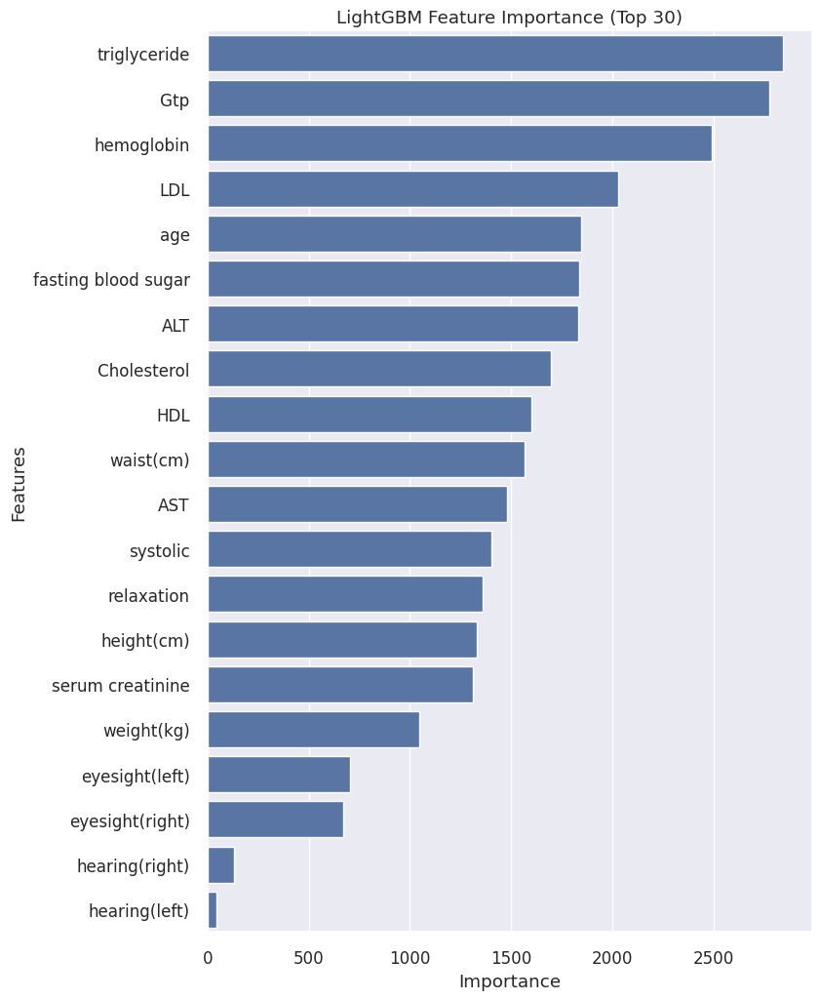

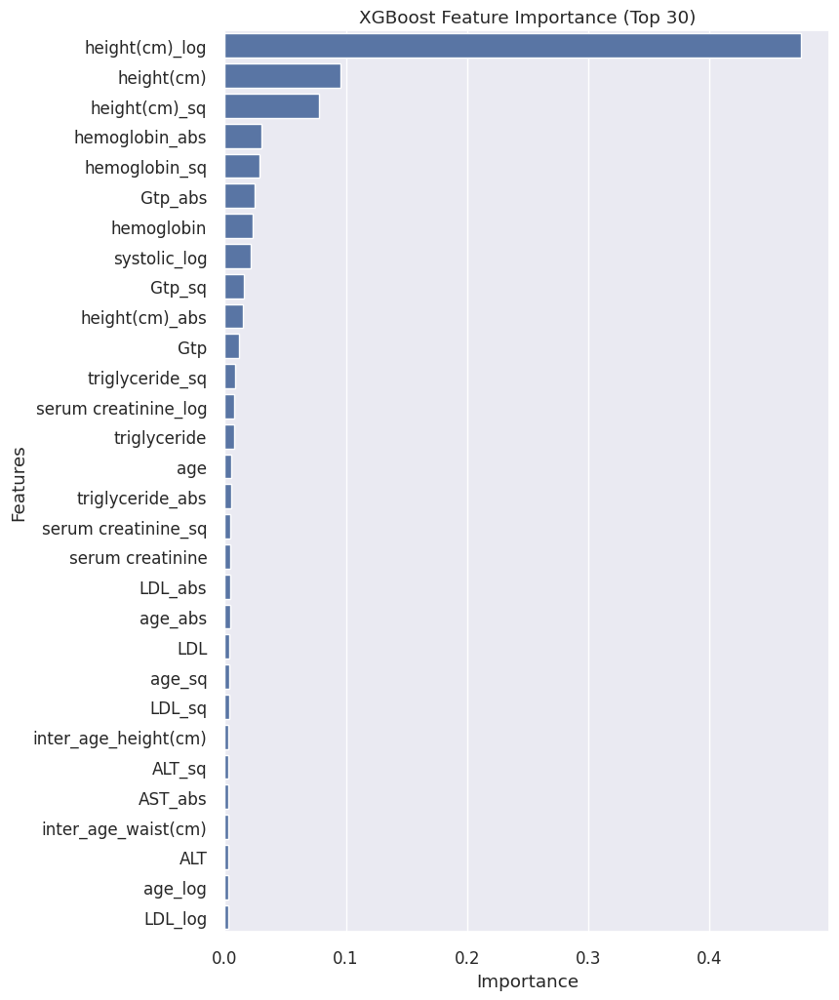

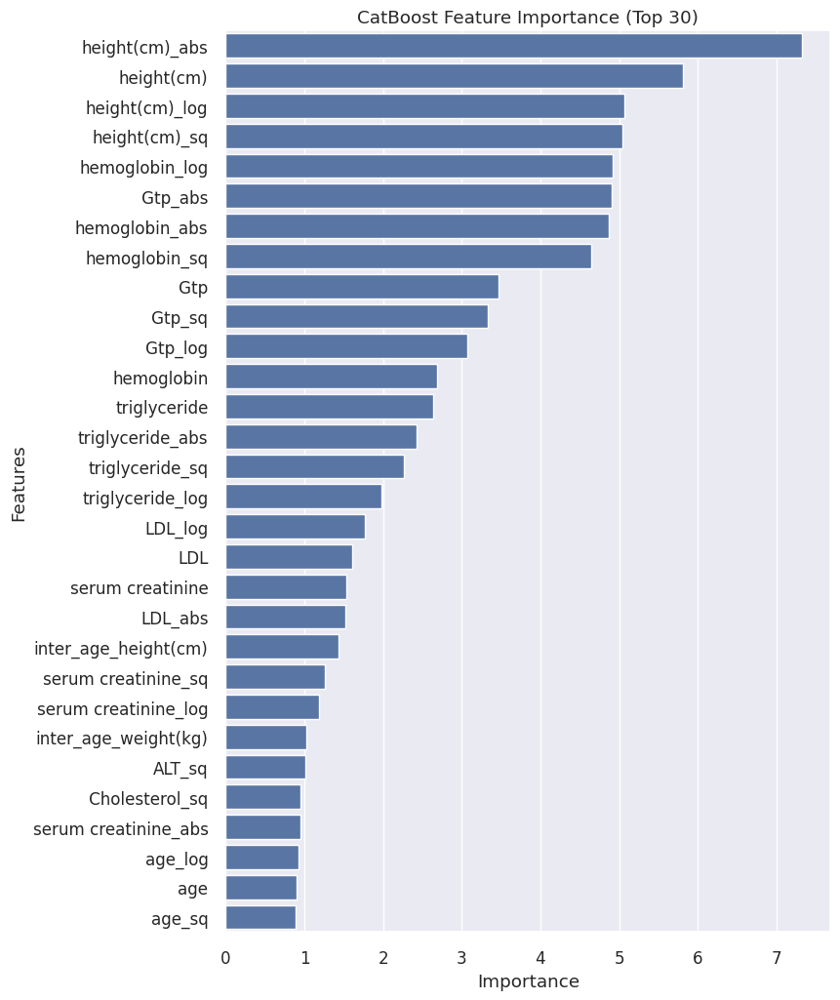

In [16]:
# Feature Importance + SHAP 기반 모델 (XGBoost / LightGBM / CatBoost) 해석

def plot_feature_importance(model, feature_names, model_name="model"):
    importance = model.feature_importances_
    idx = np.argsort(importance)[::-1]

    plt.figure(figsize=(8, 12))
    sns.barplot(
        x=importance[idx][:30],
        y=np.array(feature_names)[idx][:30],
        orient="h"
    )
    plt.title(f"{model_name} Feature Importance (Top 30)")
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.show()


# LightGBM
plot_feature_importance(lgb, X_train.columns, "LightGBM")

# XGBoost
plot_feature_importance(xgb, X_train.columns, "XGBoost")

# CatBoost
plot_feature_importance(cat, X_train.columns, "CatBoost")

In [27]:
# SHAP 기반 모델 해석

# SHAP Explainer 생성
explainer_lgb = shap.TreeExplainer(lgb)
explainer_xgb = shap.TreeExplainer(xgb)
explainer_cat = shap.TreeExplainer(cat)

shap_lgb = explainer_lgb.shap_values(X_valid)
shap_xgb = explainer_xgb.shap_values(X_valid)
shap_cat = explainer_cat.shap_values(X_valid)

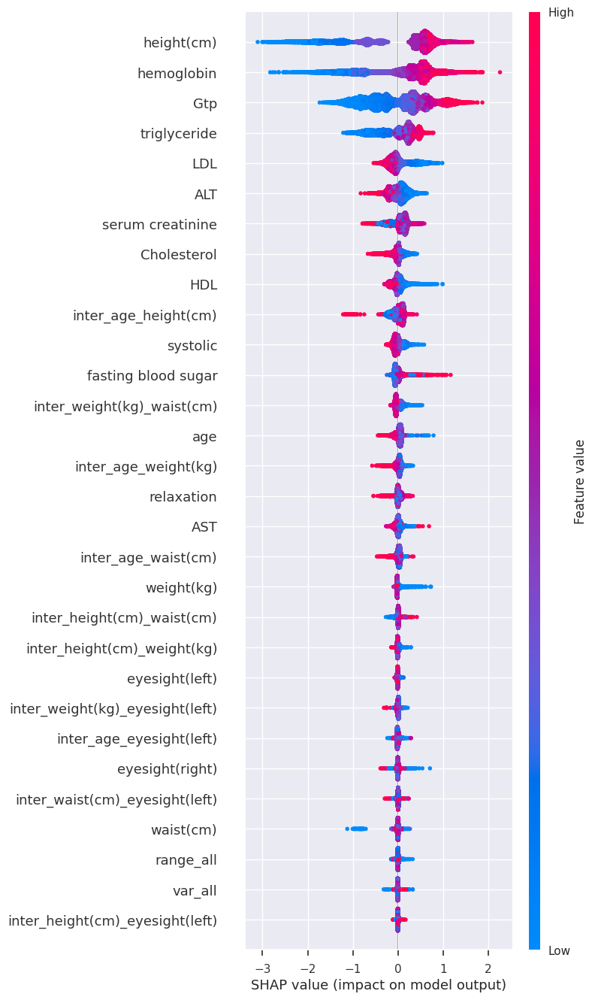

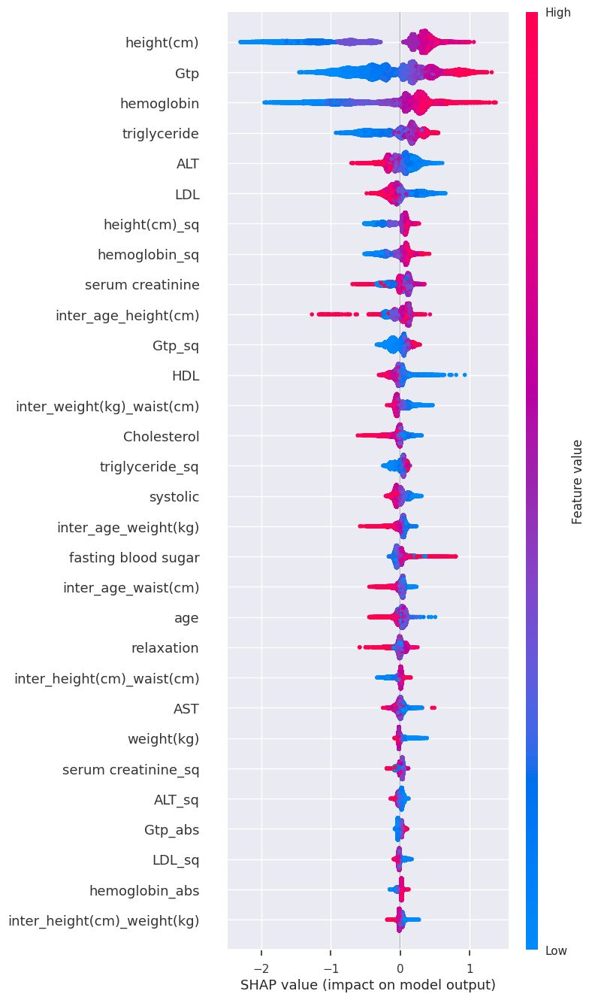

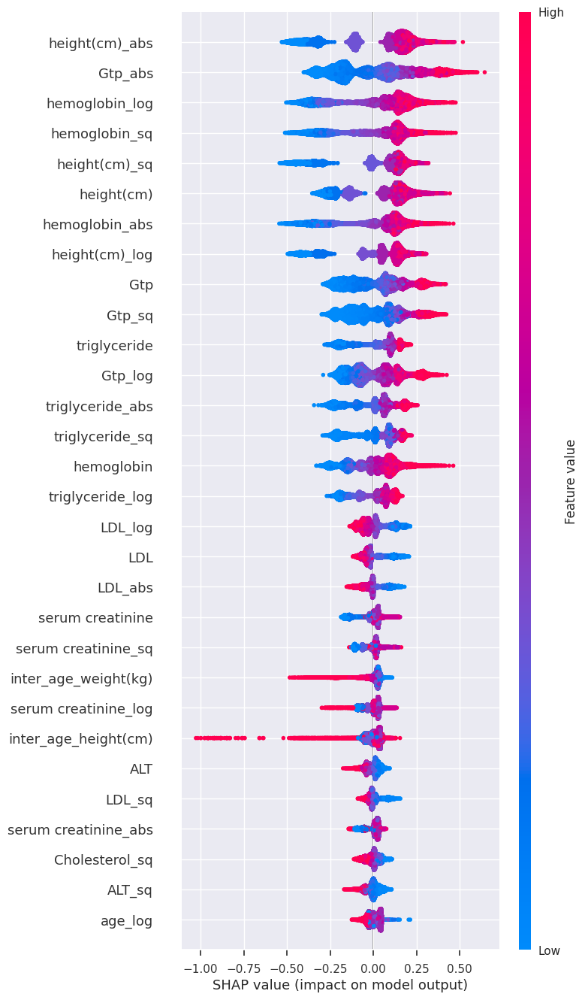

In [28]:
# SHAP Summary Plot (가장 중요한 해석 플롯; 색(Feature 값의 크기, x축(SHAP 영향력): 0보다 오른쪽 → 흡연일 확률 ↑, 중요 Feature 순서 확인 가능)

# LightGBM
shap.summary_plot(shap_lgb, X_valid, plot_type="dot", max_display=30)

# XGBoost
shap.summary_plot(shap_xgb, X_valid, plot_type="dot", max_display=30)

# CatBoost
shap.summary_plot(shap_cat, X_valid, plot_type="dot", max_display=30)

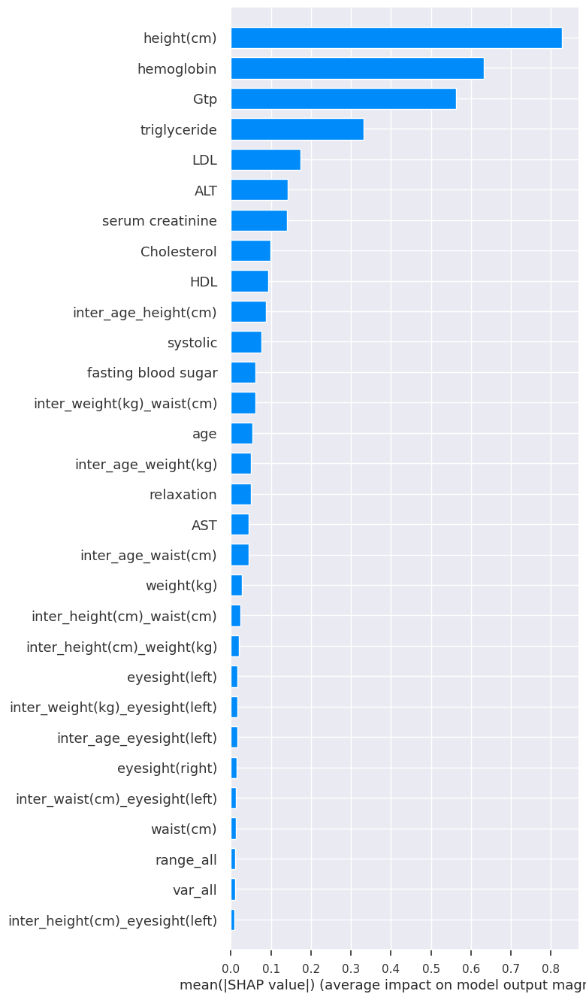

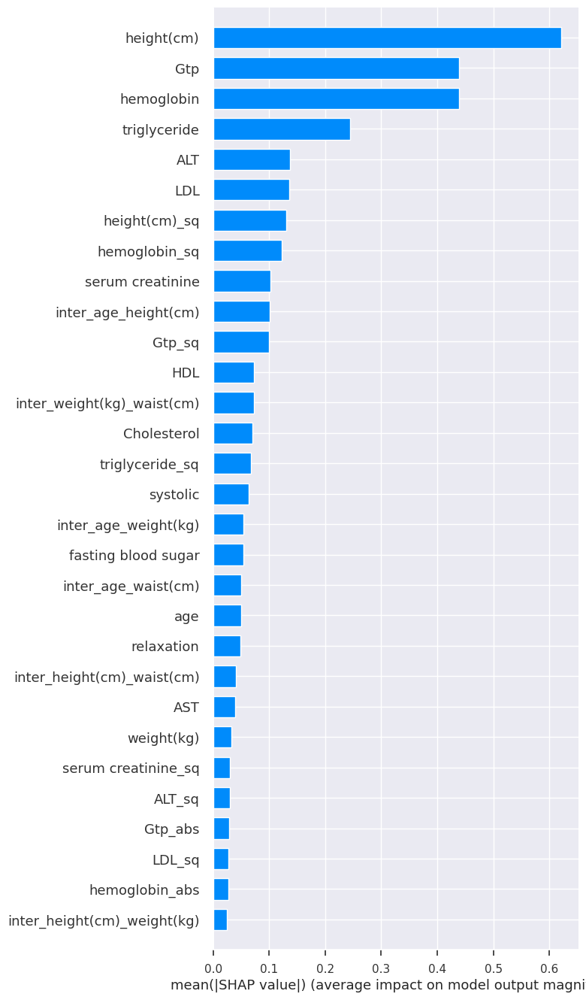

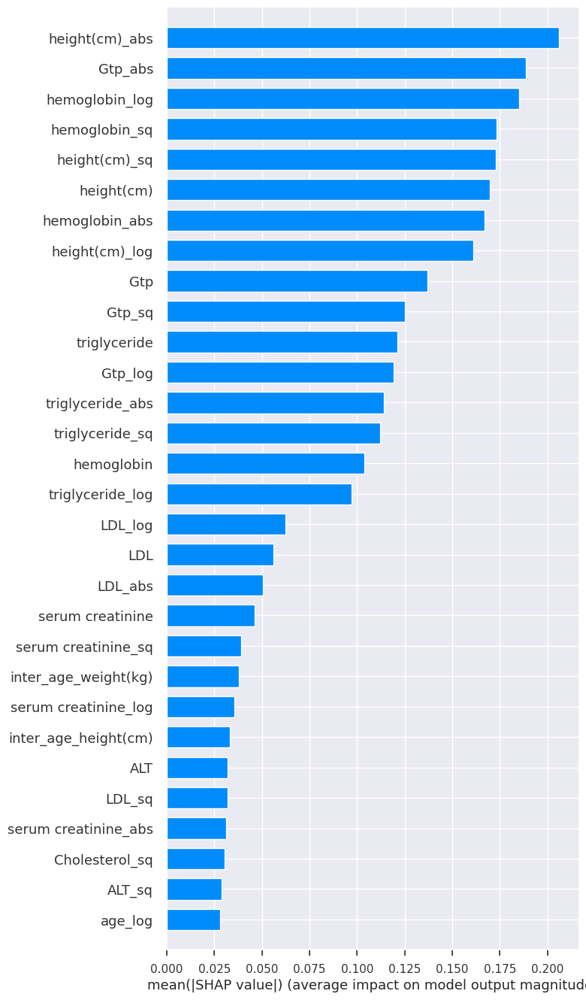

In [29]:
# SHAP Bar Plot (가장 평균적으로 중요한 변수만 시각화)

# LightGBM
shap.summary_plot(shap_lgb, X_valid, plot_type="bar", max_display=30)

# XGBoost
shap.summary_plot(shap_xgb, X_valid, plot_type="bar", max_display=30)

# CatBoost
shap.summary_plot(shap_cat, X_valid, plot_type="bar", max_display=30)

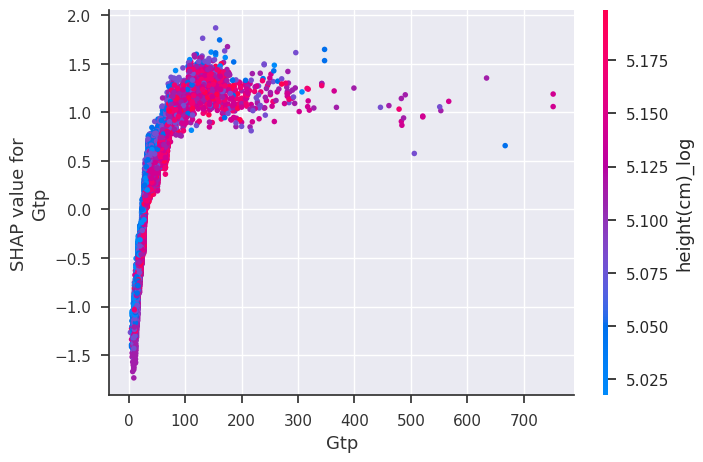

In [30]:
# SHAP Dependence Plot (변수 간 상호작용 분석; 가장 중요한 feature 1~2개만 사용)

top_feature = X_train.columns[np.argmax(lgb.feature_importances_)]
shap.dependence_plot(top_feature, shap_lgb, X_valid)

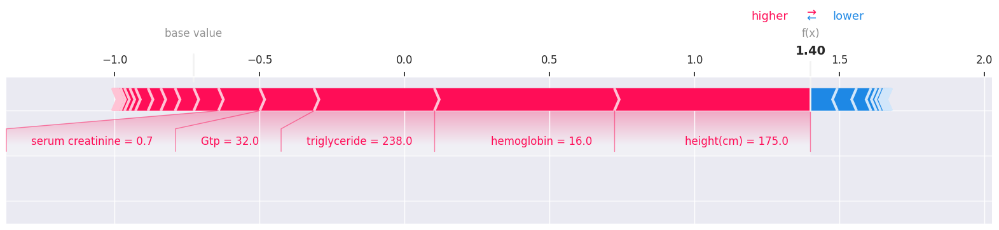

In [31]:
# SHAP Force Plot (개별 샘플 분석; 특정 validation 예측 1개 선택)

# SHAP JS 초기화
shap.initjs()

# 예시: 첫 번째 validation 샘플
i = 0

# 단일 샘플만 DataFrame 형태로 선택
X_sample = X_valid.iloc[i:i+1]

# SHAP value 계산
shap_value_sample = explainer_lgb.shap_values(X_sample)

# Force Plot
shap.plots.force(
    explainer_lgb.expected_value,  # <- base value 추가
    shap_value_sample,
    X_sample,
    matplotlib=True
)

In [ ]:
# Partial Dependence Plot (PDP)

In [32]:
# 최종 모델 선택
final_model = stack_model  # Stacking Ensemble을 최종 모델로 선택

# 학습 데이터 기준 컬럼 가져오기
train_cols = X_train.columns

# 테스트 데이터 컬럼 맞추기
for c in train_cols:
    if c not in test_fe.columns:
        test_fe[c] = 0  # 없는 컬럼은 0으로 채움

# 학습 데이터에는 있는데 테스트 데이터에 없는 컬럼 제거
test_fe = test_fe[train_cols]

# test 데이터 예측
test_pred = final_model.predict_proba(test_fe)[:,1]

# 제출 파일 생성
submission = pd.DataFrame({
    "id": pd.read_csv("/content/test.csv")["id"],  # 원본 test.csv에서 id 가져오기
    "smoking": test_pred
})

# CSV 저장
submission.to_csv("submission.csv", index=False)
print("제출 파일 생성 완료: submission.csv")

제출 파일 생성 완료: submission.csv
